# PACKAGES AND LIBRARIES

In [2]:
#GENERAL
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import random
import time

In [3]:
#PATH PROCESS
import os
import os.path
from pathlib import Path
import glob
from scipy.io import loadmat
import nibabel as nib
import csv

In [4]:
#IMAGE PROCESS
from PIL import Image
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras.preprocessing import image
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from scipy.ndimage.filters import convolve
from skimage import data, io, filters
import skimage
from skimage.morphology import convex_hull_image, erosion
from IPython import display
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.patches as patches

C:\Users\Admin\AppData\Local\Temp\ipykernel_8180\3753352574.py:9: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import convolve


In [5]:
#SCALER & TRANSFORMATION
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder

In [6]:
#ACCURACY CONTROL
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score

In [7]:
#OPTIMIZER
from keras.optimizers import RMSprop,Adam,Optimizer,Optimizer, SGD

In [8]:
#MODEL LAYERS
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization
from keras.callbacks import EarlyStopping
from keras import layers
import tensorflow as tf
from keras.applications import VGG16,VGG19,inception_v3
from keras import backend as K
from keras.utils import plot_model
from keras.datasets import mnist
import keras
from keras.models import Model


#IGNORING WARNINGS
from warnings import filterwarnings
filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

# PATH PROCESS

#### MAIN

In [9]:
Ground_PATH = Path("./Moon_Dataset/images/ground/")
Render_PATH = Path("./Moon_Dataset/images/render/")

#### PNG EXPORTING

In [10]:
Ground_PNG = list(Ground_PATH.glob("*.png"))
Render_PNG = list(Render_PATH.glob("*.png"))

In [11]:
print("GROUND LEN: ", len(Ground_PNG))
print("---"*10)
print("RENDER LEN: ", len(Render_PNG))

GROUND LEN:  9766
------------------------------
RENDER LEN:  9766


In [12]:
print("10th GROUND: ",Ground_PNG[8])
print("---"*10)
print("10th RENDER: ",Render_PNG[8])

10th GROUND:  Moon_Dataset\images\ground\ground0009.png
------------------------------
10th RENDER:  Moon_Dataset\images\render\render0009.png


In [13]:
Sorted_Ground = sorted(Ground_PNG)
Sorted_Render = sorted(Render_PNG)

In [14]:
print("10th GROUND: ",Sorted_Ground[8])
print("---"*10)
print("10th RENDER: ",Sorted_Render[8])

10th GROUND:  Moon_Dataset\images\ground\ground0009.png
------------------------------
10th RENDER:  Moon_Dataset\images\render\render0009.png


#### TO SERIES

In [15]:
Ground_SERIES = pd.Series(Sorted_Ground,name="MASK").astype(str)
Render_SERIES = pd.Series(Sorted_Render,name="IMAGE").astype(str)

In [16]:
print(Ground_SERIES.head(-1))

0       Moon_Dataset\images\ground\ground0001.png
1       Moon_Dataset\images\ground\ground0002.png
2       Moon_Dataset\images\ground\ground0003.png
3       Moon_Dataset\images\ground\ground0004.png
4       Moon_Dataset\images\ground\ground0005.png
                          ...                    
9760    Moon_Dataset\images\ground\ground9761.png
9761    Moon_Dataset\images\ground\ground9762.png
9762    Moon_Dataset\images\ground\ground9763.png
9763    Moon_Dataset\images\ground\ground9764.png
9764    Moon_Dataset\images\ground\ground9765.png
Name: MASK, Length: 9765, dtype: object


In [17]:
print(Render_SERIES.head(-1))

0       Moon_Dataset\images\render\render0001.png
1       Moon_Dataset\images\render\render0002.png
2       Moon_Dataset\images\render\render0003.png
3       Moon_Dataset\images\render\render0004.png
4       Moon_Dataset\images\render\render0005.png
                          ...                    
9760    Moon_Dataset\images\render\render9761.png
9761    Moon_Dataset\images\render\render9762.png
9762    Moon_Dataset\images\render\render9763.png
9763    Moon_Dataset\images\render\render9764.png
9764    Moon_Dataset\images\render\render9765.png
Name: IMAGE, Length: 9765, dtype: object


#### TO DATAFRAME & BOUNDING BOX

In [18]:
Main_Data = pd.concat([Render_SERIES,Ground_SERIES],axis=1)

In [19]:
print(Main_Data.columns)

Index(['IMAGE', 'MASK'], dtype='object')


In [20]:
print(Main_Data.isnull().sum())

IMAGE    0
MASK     0
dtype: int64


In [21]:
print(Main_Data.head(-1))

                                          IMAGE  \
0     Moon_Dataset\images\render\render0001.png   
1     Moon_Dataset\images\render\render0002.png   
2     Moon_Dataset\images\render\render0003.png   
3     Moon_Dataset\images\render\render0004.png   
4     Moon_Dataset\images\render\render0005.png   
...                                         ...   
9760  Moon_Dataset\images\render\render9761.png   
9761  Moon_Dataset\images\render\render9762.png   
9762  Moon_Dataset\images\render\render9763.png   
9763  Moon_Dataset\images\render\render9764.png   
9764  Moon_Dataset\images\render\render9765.png   

                                           MASK  
0     Moon_Dataset\images\ground\ground0001.png  
1     Moon_Dataset\images\ground\ground0002.png  
2     Moon_Dataset\images\ground\ground0003.png  
3     Moon_Dataset\images\ground\ground0004.png  
4     Moon_Dataset\images\ground\ground0005.png  
...                                         ...  
9760  Moon_Dataset\images\ground\grou

In [22]:
Bounding_Box = pd.read_csv("./Moon_Dataset/bounding_boxes.csv")

In [23]:
print(Bounding_Box.head(-1))

       Frame  TopLeftCornerX  TopLeftCornerY  Length  Height
0          1           278.5           192.5      56      38
1          2           599.5           151.5     121     130
2          3             5.5            46.5      90      87
3          5           239.5           101.5     103      21
4          6           682.5           124.5      34      26
...      ...             ...             ...     ...     ...
18861   9764           117.5           222.5      53      39
18862   9764           131.5           251.5     170     111
18863   9764           255.5           120.5      35      39
18864   9764           282.5            82.5      31      21
18865   9766           450.5            67.5      67      53

[18866 rows x 5 columns]


In [24]:
print(Bounding_Box["Frame"])

0           1
1           2
2           3
3           5
4           6
         ... 
18862    9764
18863    9764
18864    9764
18865    9766
18866    9766
Name: Frame, Length: 18867, dtype: int64


In [25]:
Bounding_Box = Bounding_Box.drop("Frame",axis=1)

In [26]:
print(Bounding_Box.head(-1))

       TopLeftCornerX  TopLeftCornerY  Length  Height
0               278.5           192.5      56      38
1               599.5           151.5     121     130
2                 5.5            46.5      90      87
3               239.5           101.5     103      21
4               682.5           124.5      34      26
...               ...             ...     ...     ...
18861           117.5           222.5      53      39
18862           131.5           251.5     170     111
18863           255.5           120.5      35      39
18864           282.5            82.5      31      21
18865           450.5            67.5      67      53

[18866 rows x 4 columns]


In [27]:
print("EXAMPLE 1th IMAGE BOUNDING:\n",Bounding_Box.iloc[0])

EXAMPLE 1th IMAGE BOUNDING:
 TopLeftCornerX    278.5
TopLeftCornerY    192.5
Length             56.0
Height             38.0
Name: 0, dtype: float64


In [28]:
print("EXAMPLE 1th IMAGE BOUNDING:\n",Bounding_Box.iloc[0].values)

EXAMPLE 1th IMAGE BOUNDING:
 [278.5 192.5  56.   38. ]


In [29]:
print("EXAMPLE 1th IMAGE BOUNDING TYPE:\n",type(Bounding_Box.iloc[0].values))

EXAMPLE 1th IMAGE BOUNDING TYPE:
 <class 'numpy.ndarray'>


# VISION & ANALYSIS

In [30]:
plt.style.use("dark_background")

#### SIMPLE

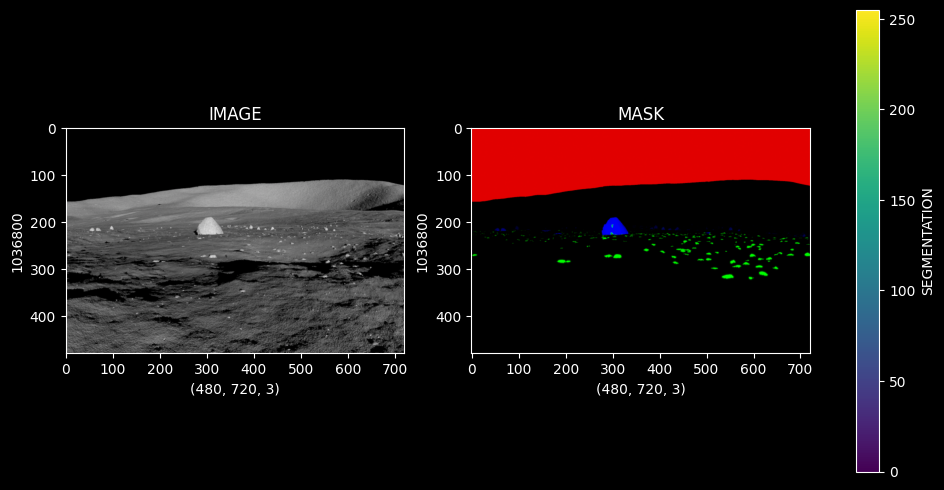

In [31]:
figure,axis = plt.subplots(1,2,figsize=(12,12))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][0]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][0]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
Operation_Colorbar = axis[1].imshow(Example_Picking_MASK)

figure.colorbar(Operation_Colorbar, ax=axis.ravel().tolist(), shrink=0.5,label='SEGMENTATION')

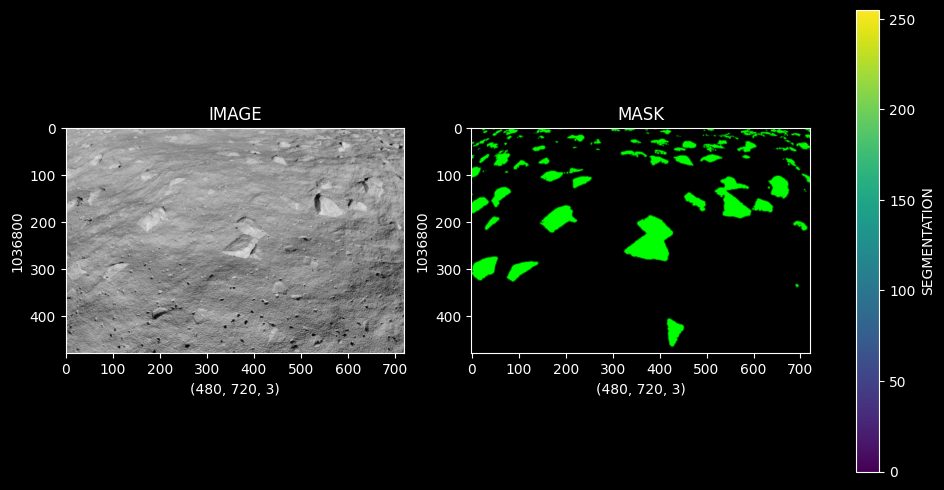

In [32]:
figure,axis = plt.subplots(1,2,figsize=(12,12))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][3777]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][3777]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
Operation_Colorbar = axis[1].imshow(Example_Picking_MASK)

figure.colorbar(Operation_Colorbar, ax=axis.ravel().tolist(), shrink=0.5,label='SEGMENTATION')

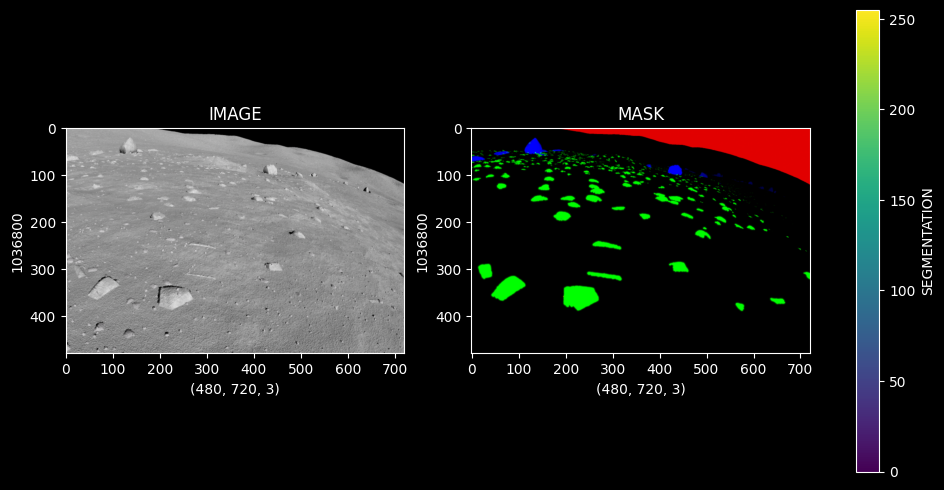

In [33]:
figure,axis = plt.subplots(1,2,figsize=(12,12))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][3000]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][3000]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
Operation_Colorbar = axis[1].imshow(Example_Picking_MASK)

figure.colorbar(Operation_Colorbar, ax=axis.ravel().tolist(), shrink=0.5,label='SEGMENTATION')

#### 2-D SPECTRUM

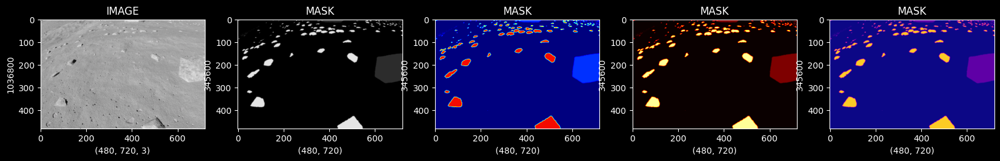

In [34]:
figure,axis = plt.subplots(1,5,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][1]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][1]),cv2.COLOR_BGR2GRAY)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK,cmap="gray")

axis[2].set_xlabel(Example_Picking_MASK.shape)
axis[2].set_ylabel(Example_Picking_MASK.size)
axis[2].set_title("MASK")
axis[2].imshow(Example_Picking_MASK,cmap="jet")

axis[3].set_xlabel(Example_Picking_MASK.shape)
axis[3].set_ylabel(Example_Picking_MASK.size)
axis[3].set_title("MASK")
axis[3].imshow(Example_Picking_MASK,cmap="hot")

axis[4].set_xlabel(Example_Picking_MASK.shape)
axis[4].set_ylabel(Example_Picking_MASK.size)
axis[4].set_title("MASK")
axis[4].imshow(Example_Picking_MASK,cmap="plasma")

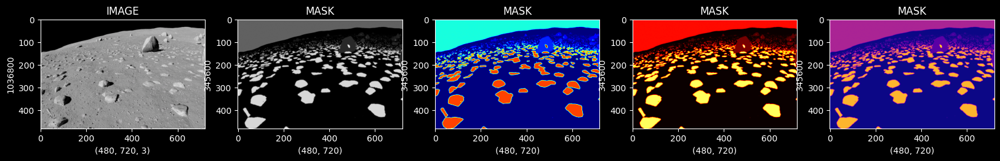

In [35]:
figure,axis = plt.subplots(1,5,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][10]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][10]),cv2.COLOR_BGR2GRAY)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK,cmap="gray")

axis[2].set_xlabel(Example_Picking_MASK.shape)
axis[2].set_ylabel(Example_Picking_MASK.size)
axis[2].set_title("MASK")
axis[2].imshow(Example_Picking_MASK,cmap="jet")

axis[3].set_xlabel(Example_Picking_MASK.shape)
axis[3].set_ylabel(Example_Picking_MASK.size)
axis[3].set_title("MASK")
axis[3].imshow(Example_Picking_MASK,cmap="hot")

axis[4].set_xlabel(Example_Picking_MASK.shape)
axis[4].set_ylabel(Example_Picking_MASK.size)
axis[4].set_title("MASK")
axis[4].imshow(Example_Picking_MASK,cmap="plasma")

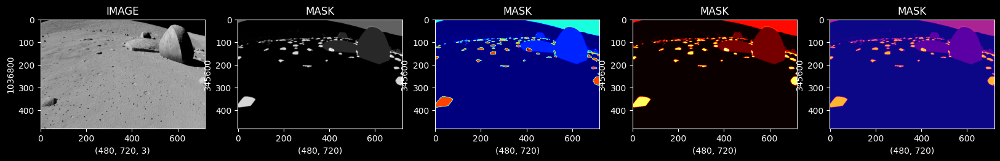

In [36]:
figure,axis = plt.subplots(1,5,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][2345]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][2345]),cv2.COLOR_BGR2GRAY)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK,cmap="gray")

axis[2].set_xlabel(Example_Picking_MASK.shape)
axis[2].set_ylabel(Example_Picking_MASK.size)
axis[2].set_title("MASK")
axis[2].imshow(Example_Picking_MASK,cmap="jet")

axis[3].set_xlabel(Example_Picking_MASK.shape)
axis[3].set_ylabel(Example_Picking_MASK.size)
axis[3].set_title("MASK")
axis[3].imshow(Example_Picking_MASK,cmap="hot")

axis[4].set_xlabel(Example_Picking_MASK.shape)
axis[4].set_ylabel(Example_Picking_MASK.size)
axis[4].set_title("MASK")
axis[4].imshow(Example_Picking_MASK,cmap="plasma")

#### LAYER READING

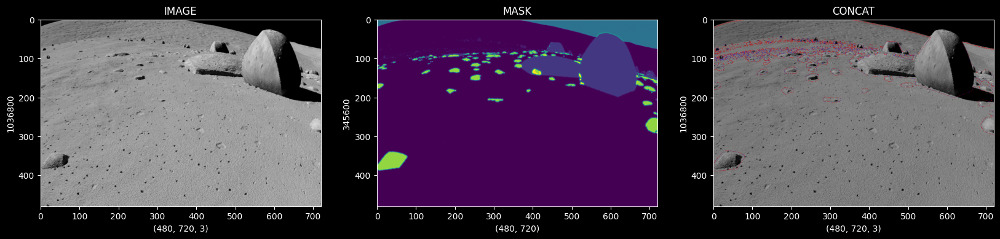

In [37]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][2345]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][2345]),cv2.COLOR_BGR2GRAY)

Copy_IMG = Example_Picking_IMG.copy()
Copy_IMG[Example_Picking_MASK == 1] = [255,0,0]
Copy_IMG[Example_Picking_MASK == 2] = [0,0,255]
Copy_Compile_IMG = Example_Picking_IMG.copy()

Layer_Concat_IMG = cv2.addWeighted(Copy_IMG,0.5,Copy_Compile_IMG,0.3,0,Copy_Compile_IMG)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG)

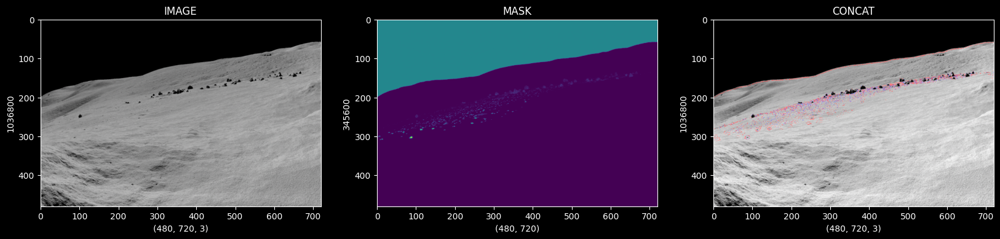

In [38]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][3]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][3]),cv2.COLOR_BGR2GRAY)

Copy_IMG = Example_Picking_IMG.copy()
Copy_IMG[Example_Picking_MASK == 1] = [255,0,0]
Copy_IMG[Example_Picking_MASK == 2] = [0,0,255]
Copy_Compile_IMG = Example_Picking_IMG.copy()

Layer_Concat_IMG = cv2.addWeighted(Copy_IMG,0.5,Copy_Compile_IMG,0.8,0.2,Copy_Compile_IMG)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG)

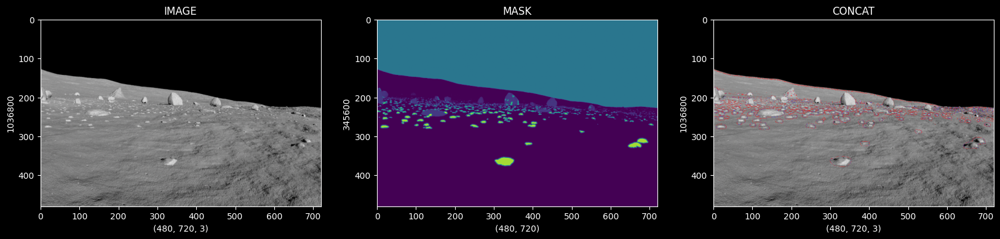

In [39]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][12]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][12]),cv2.COLOR_BGR2GRAY)

Copy_IMG = Example_Picking_IMG.copy()
Copy_IMG[Example_Picking_MASK == 1] = [255,0,0]
Copy_IMG[Example_Picking_MASK == 2] = [0,0,255]

Copy_Compile_IMG = Example_Picking_IMG.copy()

Layer_Concat_IMG = cv2.addWeighted(Copy_IMG,0.5,Copy_Compile_IMG,0.5,0,Copy_Compile_IMG)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG)

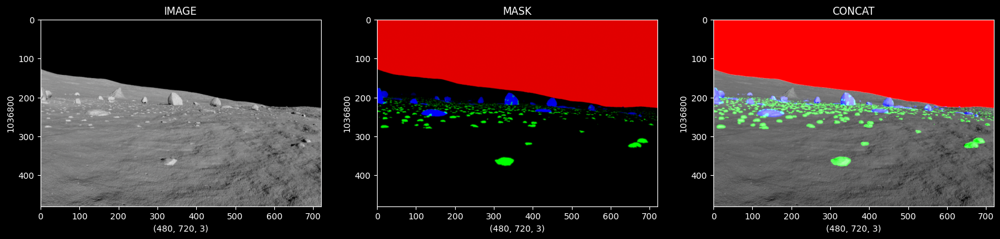

In [40]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][12]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][12]),cv2.COLOR_BGR2RGB)


Layer_Concat_IMG = cv2.addWeighted(Example_Picking_IMG,0.8,Example_Picking_MASK,5.0,0.5)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG)

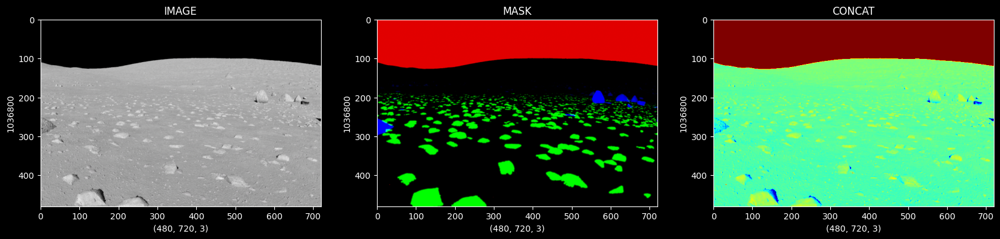

In [41]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][888]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][888]),cv2.COLOR_BGR2RGB)

Layer_Concat_IMG = cv2.addWeighted(Example_Picking_IMG,0.7,Example_Picking_MASK,2.9,1.5)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)


axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG[:,:,0],cmap="jet")

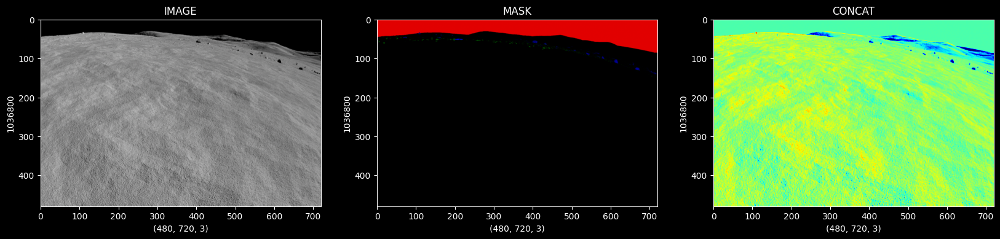

In [42]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][552]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][552]),cv2.COLOR_BGR2RGB)


Layer_Concat_IMG = cv2.addWeighted(Example_Picking_IMG,0.8,Example_Picking_MASK,0.4,0.5)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG[:,:,0],cmap="jet")

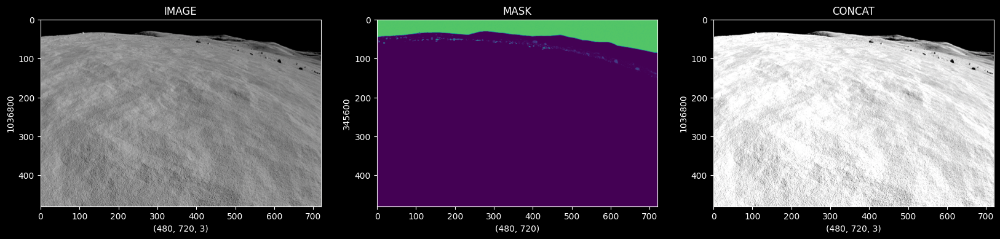

In [43]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][552]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][552]),cv2.COLOR_BGR2GRAY)

Copy_IMG = Example_Picking_IMG.copy()
Copy_IMG[Example_Picking_MASK == 255] = (255,0,255)

Layer_Concat_IMG = cv2.addWeighted(Example_Picking_IMG,0.8,Copy_IMG,0.9,0.5)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG)

#### BOUNDING

In [44]:
print(Bounding_Box.iloc[0].values)

[278.5 192.5  56.   38. ]


In [45]:
print(Bounding_Box.iloc[0].values[0])
print(Bounding_Box.iloc[0].values[1])
print(Bounding_Box.iloc[0].values[2])
print(Bounding_Box.iloc[0].values[3])

278.5
192.5
56.0
38.0


In [46]:
print(Bounding_Box.iloc[0].values.reshape(2,2))

[[278.5 192.5]
 [ 56.   38. ]]


In [47]:
for coordinates_x, coordinates_y in Bounding_Box.iloc[0].values.reshape(2,2):
    coordinates_x = int(coordinates_x)
    coordinates_y = int(coordinates_y)
    print(coordinates_x)
    print(coordinates_y)

278
192
56
38


In [48]:
for coordinates_x, coordinates_y in Bounding_Box.iloc[0].values.reshape(2,2):
    print(coordinates_x)
    print(coordinates_y)

278.5
192.5
56.0
38.0


In [49]:
x = Bounding_Box.iloc[2].values[0]
y = Bounding_Box.iloc[2].values[1]
t = Bounding_Box.iloc[2].values[2]
s = Bounding_Box.iloc[2].values[3]
start_point = (x, y)
end_point = (x + t, y + s)
print(start_point)
print(end_point)

(5.5, 46.5)
(95.5, 133.5)


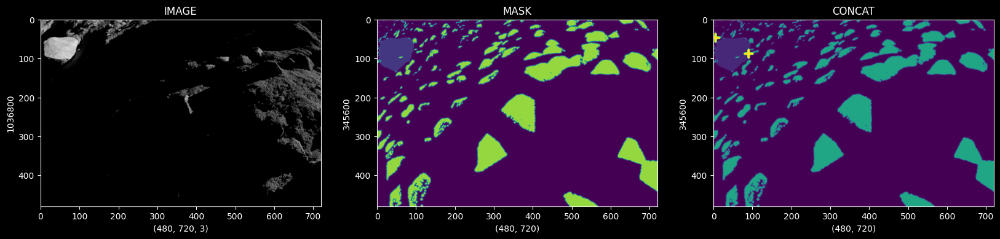

In [50]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][2]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][2]),cv2.COLOR_BGR2GRAY)

Copy_Mask = Example_Picking_MASK.copy()
for coordinates_x, coordinates_y in Bounding_Box.iloc[2].values.reshape(2,2):
    coordinates_x = int(coordinates_x)
    coordinates_y = int(coordinates_y)
    cv2.drawMarker(Copy_Mask, (coordinates_x, coordinates_y), (255, 0, 0),thickness=5)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Copy_Mask.shape)
axis[2].set_ylabel(Copy_Mask.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Copy_Mask)

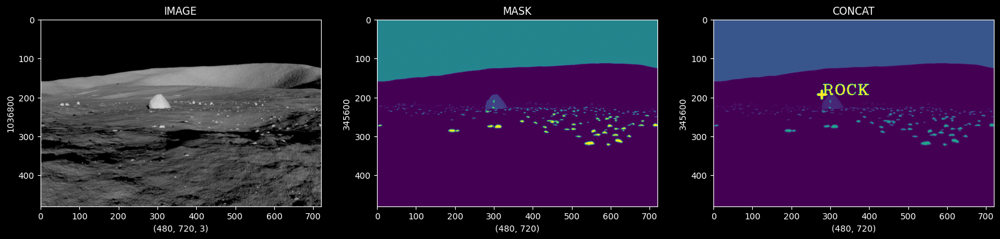

In [51]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][0]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][0]),cv2.COLOR_BGR2GRAY)

Copy_Mask = Example_Picking_MASK.copy()

x = Bounding_Box.iloc[0].values[0]
y = Bounding_Box.iloc[0].values[1]
t = Bounding_Box.iloc[0].values[2]
s = Bounding_Box.iloc[0].values[3]


Copy_Mask = Example_Picking_MASK.copy()

Marker_Image = cv2.drawMarker(Copy_Mask, (int(x), int(y)), (255, 0, 0),thickness=5)
cv2.putText(Copy_Mask, "ROCK", (int(x), int(y)), cv2.FONT_HERSHEY_COMPLEX_SMALL, 2, (255, 0, 0), 2)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Marker_Image.shape)
axis[2].set_ylabel(Marker_Image.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Marker_Image)

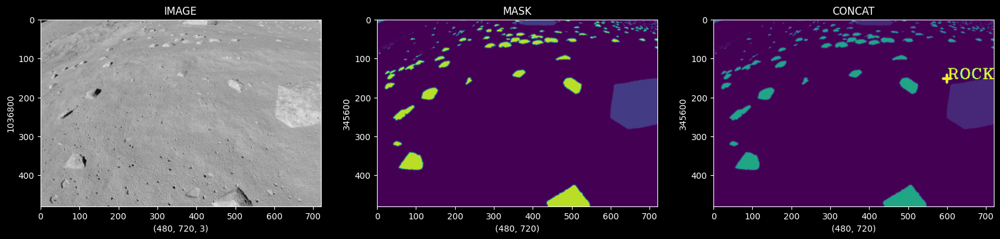

In [52]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][1]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][1]),cv2.COLOR_BGR2GRAY)

Copy_Mask = Example_Picking_MASK.copy()

x = Bounding_Box.iloc[1].values[0]
y = Bounding_Box.iloc[1].values[1]
t = Bounding_Box.iloc[1].values[2]
s = Bounding_Box.iloc[1].values[3]


Copy_Mask = Example_Picking_MASK.copy()

Marker_Image = cv2.drawMarker(Copy_Mask, (int(x), int(y)), (255, 0, 0),thickness=5)
cv2.putText(Copy_Mask, "ROCK", (int(x), int(y)), cv2.FONT_HERSHEY_COMPLEX_SMALL, 2, (255, 0, 0), 2)
axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Marker_Image.shape)
axis[2].set_ylabel(Marker_Image.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Marker_Image)

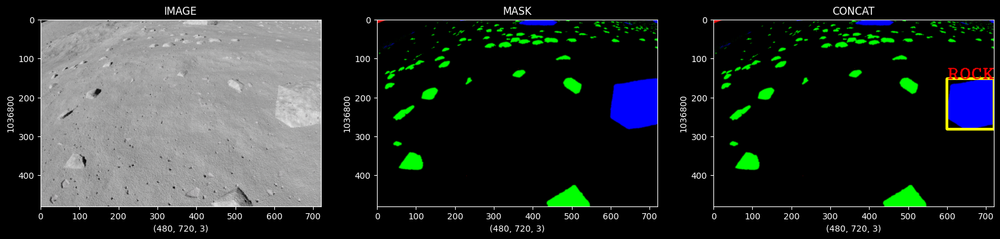

In [53]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][1]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][1]),cv2.COLOR_BGR2RGB)

Copy_Mask = Example_Picking_MASK.copy()

x = Bounding_Box.iloc[1].values[0]
y = Bounding_Box.iloc[1].values[1]
t = Bounding_Box.iloc[1].values[2]
s = Bounding_Box.iloc[1].values[3]

Copy_Mask = Example_Picking_MASK.copy()

Rec_IMG = cv2.rectangle(Copy_Mask, (int(x), int(y)), (int(x + t), int(y + s)), (255, 255, 0), 5)
cv2.putText(Copy_Mask, "ROCK", (int(x), int(y)), cv2.FONT_HERSHEY_COMPLEX_SMALL, 2, (255, 0, 0), 2)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Rec_IMG.shape)
axis[2].set_ylabel(Rec_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Rec_IMG)

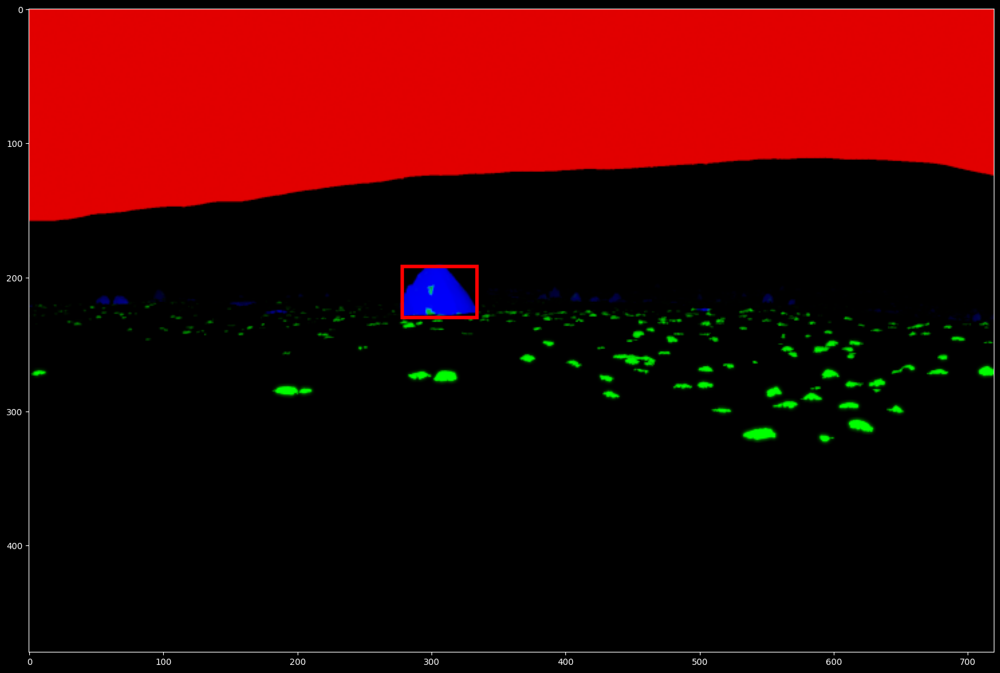

In [54]:
figure,axis = plt.subplots(1,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][0]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][0]),cv2.COLOR_BGR2RGB)

Bound_Coor = []
with open("./Moon_Dataset/bounding_boxes.csv") as bounding_boxes_csv:
    CSV_Reader = csv.reader(bounding_boxes_csv, delimiter=',')
    next(bounding_boxes_csv)
    for rows in CSV_Reader:
        if rows[0] == '1':
            Bound_Coor.append(rows[1:5])
        else:
            break
axis.imshow(Example_Picking_MASK)

for bounding_coor in Bound_Coor:
    bounding_box = list(map(float, bounding_coor)) 
    Rect_Image = patches.Rectangle((bounding_box[0]-0.5,bounding_box[1]-0.5),
                             bounding_box[2],bounding_box[3],
                             linewidth=4,
                             edgecolor='r',facecolor='none')
    axis.add_patch(Rect_Image)

# TRANSFORMATION DATA

#### REDUCING FOR MEMORY FOR KERNEL

In [55]:
Main_Data_Reduced = Main_Data[0:1000]

In [56]:
print(Main_Data_Reduced.head(-1))

                                         IMAGE  \
0    Moon_Dataset\images\render\render0001.png   
1    Moon_Dataset\images\render\render0002.png   
2    Moon_Dataset\images\render\render0003.png   
3    Moon_Dataset\images\render\render0004.png   
4    Moon_Dataset\images\render\render0005.png   
..                                         ...   
994  Moon_Dataset\images\render\render0995.png   
995  Moon_Dataset\images\render\render0996.png   
996  Moon_Dataset\images\render\render0997.png   
997  Moon_Dataset\images\render\render0998.png   
998  Moon_Dataset\images\render\render0999.png   

                                          MASK  
0    Moon_Dataset\images\ground\ground0001.png  
1    Moon_Dataset\images\ground\ground0002.png  
2    Moon_Dataset\images\ground\ground0003.png  
3    Moon_Dataset\images\ground\ground0004.png  
4    Moon_Dataset\images\ground\ground0005.png  
..                                         ...  
994  Moon_Dataset\images\ground\ground0995.png  
995  Mo

#### IMAGE TRANSFORMATION FOR LABELING

In [57]:
Image_List = []
Transformation_List = []

for image_x,mask_x in zip(Main_Data_Reduced.IMAGE.values,Main_Data_Reduced.MASK.values):
    
    Picking_IMG = cv2.cvtColor(cv2.imread(image_x),cv2.COLOR_BGR2RGB)
    Picking_MASK = cv2.cvtColor(cv2.imread(mask_x),cv2.COLOR_BGR2RGB)
    Layer_Concat_IMG = cv2.addWeighted(Picking_IMG,0.8,Picking_MASK,5.0,0.5)
    
    Resized_Image = cv2.resize(Picking_IMG,(256,256))
    Resized_Transformation = cv2.resize(Layer_Concat_IMG,(256,256))
    
    Resized_Image = Resized_Image / 255.
    Resized_Transformation = Resized_Transformation / 255.
    
    Image_List.append(Resized_Image)
    Transformation_List.append(Resized_Transformation)

In [58]:
print("ARRAY IMAGE SHAPE: ",np.shape(np.array(Image_List)))
print("ARRAY MASK SHAPE: ",np.shape(np.array(Transformation_List)))

ARRAY IMAGE SHAPE:  (1000, 256, 256, 3)
ARRAY MASK SHAPE:  (1000, 256, 256, 3)


Text(0.5, 1.0, 'LUNAR')

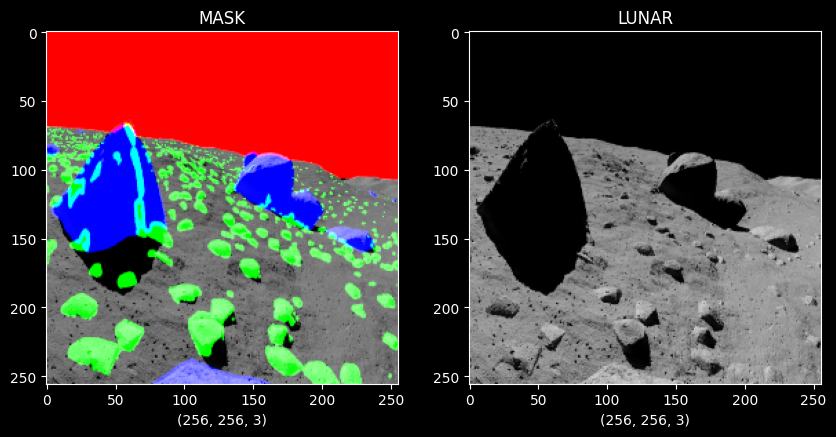

In [59]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_List[14])
axis[0].set_xlabel(Transformation_List[14].shape)
axis[0].set_title("MASK")
axis[1].imshow(Image_List[14])
axis[1].set_xlabel(Image_List[14].shape)
axis[1].set_title("LUNAR")

Text(0.5, 1.0, 'LUNAR')

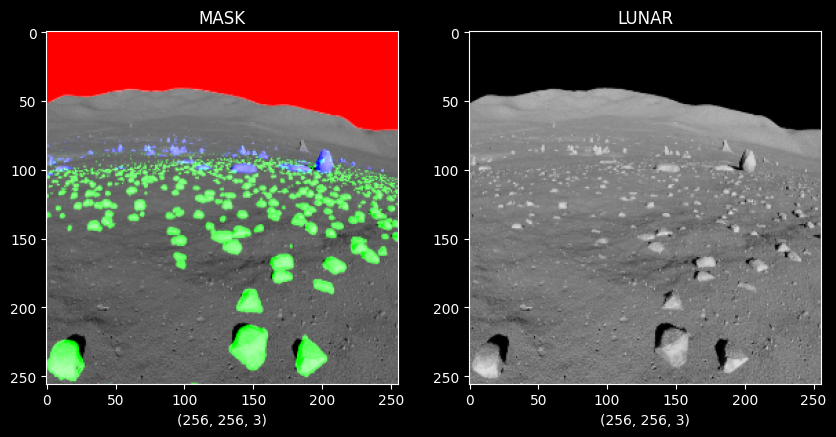

In [60]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_List[100])
axis[0].set_xlabel(Transformation_List[100].shape)
axis[0].set_title("MASK")
axis[1].imshow(Image_List[100])
axis[1].set_xlabel(Image_List[100].shape)
axis[1].set_title("LUNAR")

Text(0.5, 1.0, 'LUNAR')

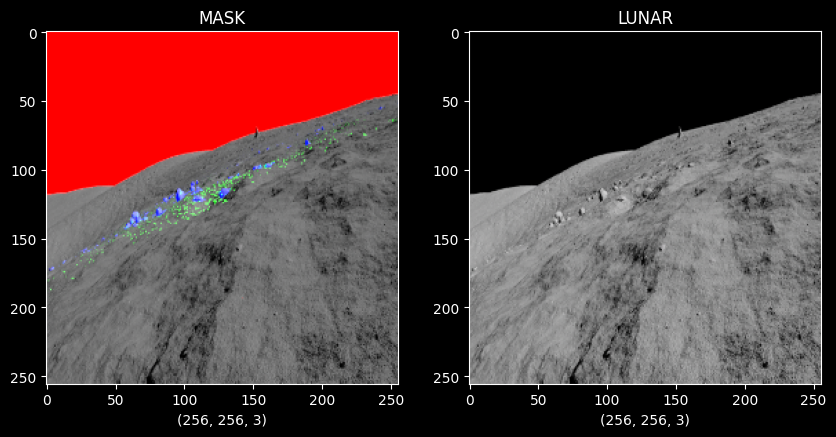

In [61]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_List[450])
axis[0].set_xlabel(Transformation_List[450].shape)
axis[0].set_title("MASK")
axis[1].imshow(Image_List[450])
axis[1].set_xlabel(Image_List[450].shape)
axis[1].set_title("LUNAR")

#### TRANSFORMATION ARRAY

In [62]:
Train_Set = np.array(Image_List,dtype="float32")
Transformation_Set = np.array(Transformation_List,dtype="float32")

In [63]:
print("TRAIN SHAPE: ",Train_Set.shape)
print("TRANSFORMATION SHAPE: ",Transformation_Set.shape)
print("---"*10)
print("TRAIN DTYPE: ",Train_Set.dtype)
print("TRANSFORMATION DTYPE: ",Transformation_Set.dtype)

TRAIN SHAPE:  (1000, 256, 256, 3)
TRANSFORMATION SHAPE:  (1000, 256, 256, 3)
------------------------------
TRAIN DTYPE:  float32
TRANSFORMATION DTYPE:  float32


## Autoencoder Model

In [ ]:
#define ReLU layer
class MyReLU(tf.keras.layers.Layer):
    def call(self, inputs):
        return tf.maximum(0.0, inputs)
    
    
#define Conv2D layer
class MyConv2D(tf.keras.layers.Layer):
    def __init__(self, filters, kernel_size, activation=None, padding='same', **kwargs):
        super(MyConv2D, self).__init__()
        self.filters = filters
        self.kernel_size = kernel_size
        self.activation = activation
        self.padding = padding.lower() if padding == 'same' else padding
        self.conv = tf.keras.layers.Conv2D(filters, kernel_size, activation=None, padding=self.padding)

    def call(self, inputs):
        x = self.conv(inputs)
        if self.activation:
            x = self.activation(x)
        return x
        
        
#define Conv2DTranspose layer
class MyConv2DTranspose(tf.keras.layers.Layer):
    def __init__(self, filters, kernel_size, activation=None, padding='same', **kwargs):
        super(MyConv2DTranspose, self).__init__()
        self.filters = filters
        self.kernel_size = kernel_size
        self.activation = activation
        self.padding = padding.lower() if padding == 'same' else padding
        self.conv_transpose = tf.keras.layers.Conv2DTranspose(
            filters, kernel_size, activation=None, padding=self.padding)

    def call(self, inputs):
        x = self.conv_transpose(inputs)
        if self.activation:
            x = self.activation(x)
        return x
            

#define loss function
def custom_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy()
    loss = bce(y_true, y_pred)
    return loss


#define AutoEncoder model
class AutoEncoder(tf.keras.Model):
    def __init__(self, input_shape):
        super(AutoEncoder, self).__init__()
        self.encoder = self.build_encoder(input_shape)
        self.decoder = self.build_decoder(input_shape)

    def build_encoder(self, input_shape):
        model = tf.keras.Sequential([
            MyConv2D(32, (3, 3), activation=None, padding='same', input_shape=input_shape),
            BatchNormalization(),
            MyReLU(),
            MyConv2D(64, (3, 3), activation=None, padding='same'),
            BatchNormalization(),
            MyReLU(),
            MyConv2D(128, (3, 3), activation=None, padding='same'),
            BatchNormalization(),
            MyReLU(),
            MyConv2D(256, (3, 3), activation=None, padding='same'), 
            BatchNormalization(),
            MyReLU()
        ])
        return model

    def build_decoder(self, input_shape):
        model = tf.keras.Sequential([
            MyConv2DTranspose(128, (2, 2), strides=(2, 2), padding='same'), 
            MyReLU(),
            MyConv2DTranspose(64, (5, 5), strides=(2, 2), activation=None, padding='same'),  
            MyReLU(),
            MyConv2DTranspose(32, (5, 5), strides=(2, 2), activation=None, padding='same'),
            MyReLU(),
            MyConv2DTranspose(output_class, (5, 5), strides=(2, 2), activation=None, padding='same'),
            MyReLU()
        ])
        return model

    def call(self, inputs):
        x = self.encoder(inputs)
        x = self.decoder(x)
        return x
    
    
class RandomLearningRateScheduler(tf.keras.callbacks.Callback):
    def __init__(self, initial_lr, schedule, seed=None):
        super(RandomLearningRateScheduler, self).__init__()
        self.initial_lr = initial_lr
        self.schedule = schedule
        self.seed = seed
        self.random_generator = np.random.default_rng(seed)

    def on_epoch_begin(self, epoch, logs=None):
        if epoch in self.schedule:
            new_lr = self.initial_lr * self.random_generator.uniform(low=0.5, high=2.0)
            tf.keras.backend.set_value(self.model.optimizer.lr, new_lr)
            print(f'Epoch {epoch + 1}: Learning Rate = {new_lr:.6f}')



initial_learning_rate = 0.0001
lr_schedule = {10, 20, 30, 40} 

random_lr_scheduler = RandomLearningRateScheduler(initial_learning_rate, lr_schedule, seed=42)

    
#define input shape and output class
input_shape = (256, 256, 3)
output_class = 3

#create the AutoEncoder model
autoencoder = AutoEncoder(input_shape)

#compile the model with BCE loss
compile_loss = custom_loss
compile_optimizer = tf.keras.optimizers.Adam()
autoencoder.compile(loss=compile_loss, optimizer=compile_optimizer, metrics=["accuracy"])

#define early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss', 
    patience=10,  
    restore_best_weights=True 
)

#train the model
history = autoencoder.fit(Train_Set, Transformation_Set, epochs=50, batch_size=32, validation_split=0.2, callbacks=[early_stopping, random_lr_scheduler])

#save the model after training
autoencoder.save('autoencoder_model2.h5')


In [67]:
print(autoencoder.summary())

Model: "auto_encoder_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_2 (Sequential)   (None, 256, 256, 256)     390336    
                                                                 
 sequential_3 (Sequential)   (None, 256, 256, 1)       388097    
                                                                 
Total params: 778433 (2.97 MB)
Trainable params: 777473 (2.97 MB)
Non-trainable params: 960 (3.75 KB)
_________________________________________________________________
None


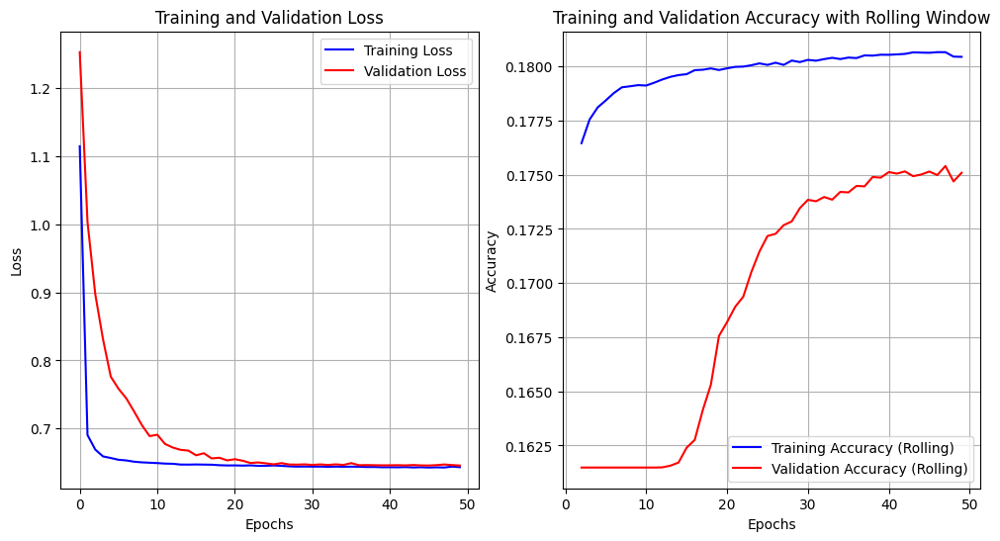

In [118]:
import matplotlib.pyplot as plt
import pandas as pd

# Set the style to 'seaborn-whitegrid'
plt.style.use('default')

# Access the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plot the loss curves
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='red')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid(True)

# Plot the accuracy curves with a rolling window
plt.subplot(1, 2, 2)
window_size = 3  # Adjust the window size as needed
rolling_train_accuracy = pd.Series(train_accuracy).rolling(window=window_size).mean()
rolling_val_accuracy = pd.Series(val_accuracy).rolling(window=window_size).mean()

plt.plot(rolling_train_accuracy, label='Training Accuracy (Rolling)', color='blue')
plt.plot(rolling_val_accuracy, label='Validation Accuracy (Rolling)', color='red')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy with Rolling Window')
plt.grid(True)

plt.show()


In [113]:
import numpy as np

validation_split = 0.2 
total_samples = len(Train_Set)
split_index = int((1 - validation_split) * total_samples)

#get the validation data and labels
validation_data = Train_Set[split_index:]
validation_labels = Transformation_Set[split_index:]

#predict using the trained autoencoder on the validation data
y_pred = autoencoder.predict(validation_data)

#threshold the reconstructed outputs to obtain binary predictions
threshold = 0.5  # You can adjust this threshold based on your problem
y_pred_binary = (y_pred > threshold).astype(int)

#convert validation data to binary (0 and 1)
validation_binary = (validation_data > 0.5).astype(int)

#calculate pixel-wise accuracy
pixel_wise_accuracy = np.mean(validation_binary == y_pred_binary)
print(f'Pixel-wise Accuracy: {pixel_wise_accuracy:.4f}')

#calculate Intersection over Union (IoU)
intersection = np.sum(np.logical_and(validation_binary, y_pred_binary))
union = np.sum(np.logical_or(validation_binary, y_pred_binary))
iou = intersection / union
print(f'Intersection over Union (IoU): {iou:.4f}')

#calculate Dice Coefficient
dice = (2 * intersection) / (np.sum(validation_binary) + np.sum(y_pred_binary))
print(f'Dice Coefficient: {dice:.4f}')


7/7 [==============================] - 43s 6s/step
Pixel-wise Accuracy: 0.7559
Intersection over Union (IoU): 0.4839
Dice Coefficient: 0.8397


- Pixel-wise Accuracy (0.7559): This score indicates that approximately 75.59% of the pixels have been correctly classified. While accuracy is a common metric, it might not be the most informative for imbalanced datasets or when there's a class imbalance between foreground and background pixels.

- Intersection over Union (IoU): An IoU of 0.4839 is moderate. IoU values range from 0 to 1, where higher values indicate better overlap between the predicted and true segmentations. An IoU of 0.5 or higher is often considered good, but the specific threshold depends on the application.

- Dice Coefficient (0.8397): The Dice Coefficient, also known as the F1 score for segmentation, is quite high. A value close to 1 indicates good agreement between the predicted and true segmentations. However, like IoU, the interpretation can depend on the application.

In [82]:
print(autoencoder.layers)

[<keras.src.engine.sequential.Sequential object at 0x0000017CD3548C10>, <keras.src.engine.sequential.Sequential object at 0x0000017CD3546790>]


In [112]:
autoencoder.summary()

Model: "auto_encoder_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_2 (Sequential)   (None, 256, 256, 256)     390336    
                                                                 
 sequential_3 (Sequential)   (None, 256, 256, 1)       388097    
                                                                 
Total params: 778433 (2.97 MB)
Trainable params: 777473 (2.97 MB)
Non-trainable params: 960 (3.75 KB)
_________________________________________________________________


#### SAMPLE PREDICTION

In [85]:
Prediction_MASK_Seen = autoencoder.predict(Train_Set[:10])

1/1 [==============================] - 2s 2s/step


Text(0.5, 1.0, 'PREDICTION')

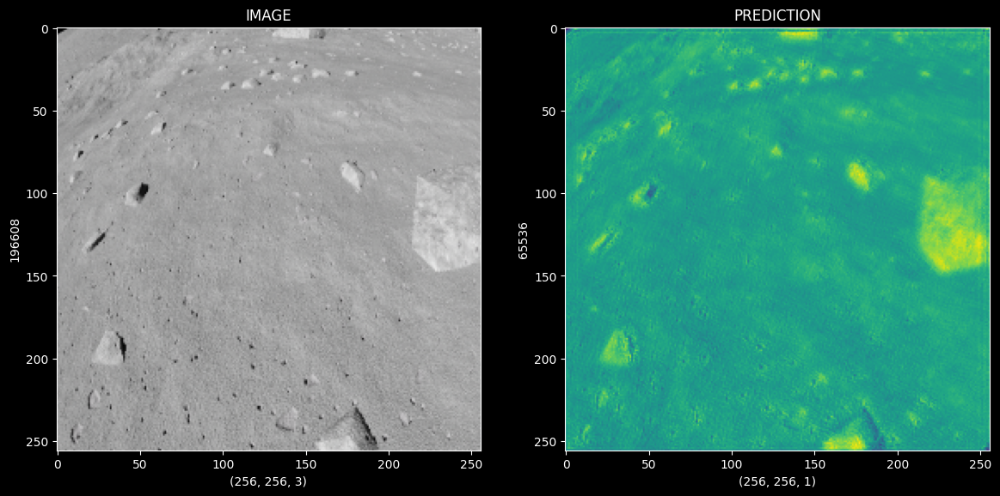

In [86]:
figure,axis = plt.subplots(1,2,figsize=(14,14))
pre_img_number = 1

Original_Img = Train_Set[pre_img_number]
Predict_Mask = Prediction_MASK_Seen[pre_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

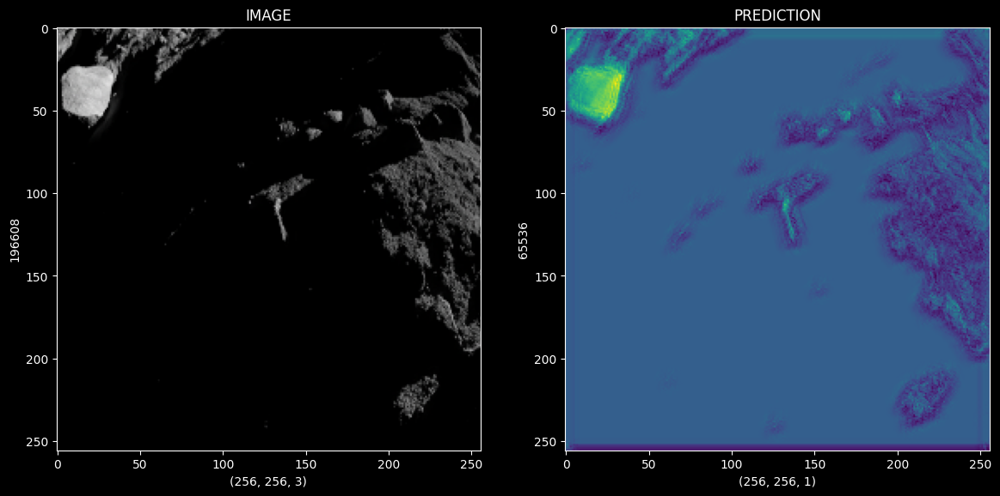

In [87]:
figure,axis = plt.subplots(1,2,figsize=(14,14))
pre_img_number = 2

Original_Img = Train_Set[pre_img_number]
Predict_Mask = Prediction_MASK_Seen[pre_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

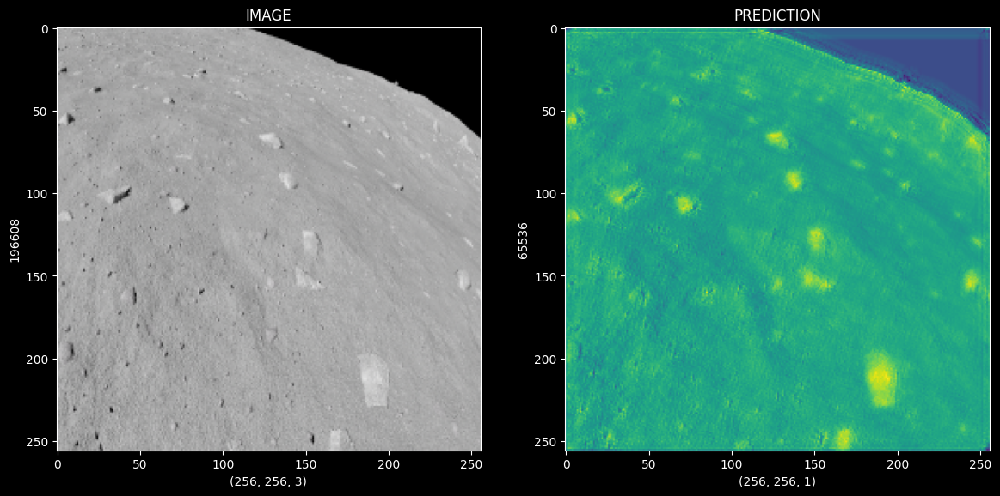

In [88]:
figure,axis = plt.subplots(1,2,figsize=(14,14))
pre_img_number = 5

Original_Img = Train_Set[pre_img_number]
Predict_Mask = Prediction_MASK_Seen[pre_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

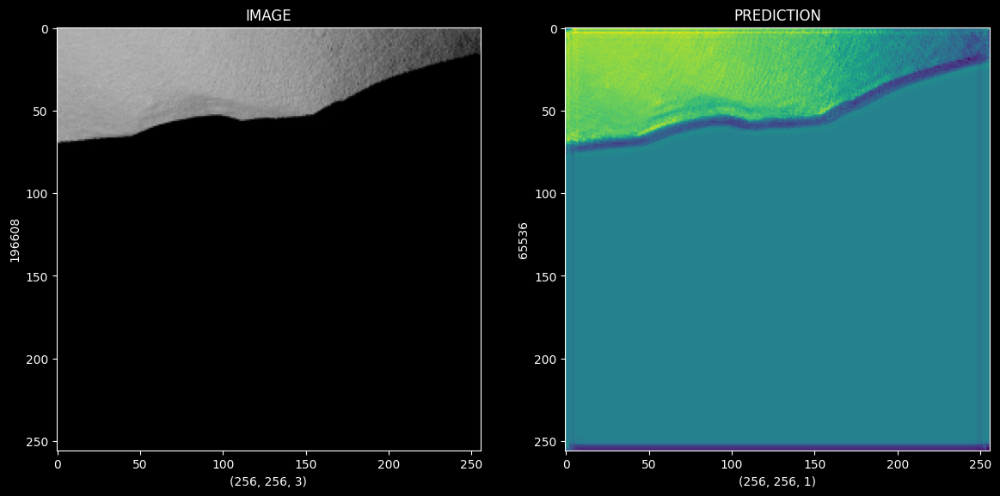

In [89]:
figure,axis = plt.subplots(1,2,figsize=(14,14))
pre_img_number = 8

Original_Img = Train_Set[pre_img_number]
Predict_Mask = Prediction_MASK_Seen[pre_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

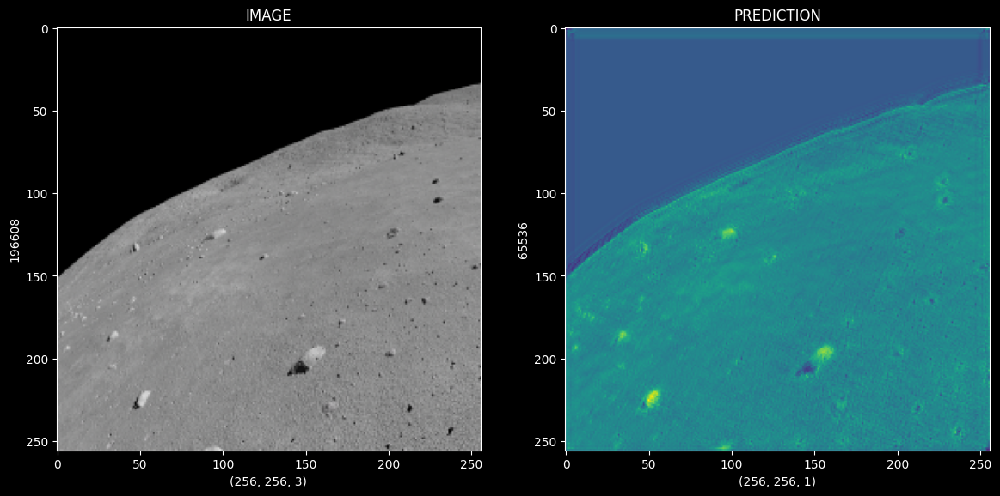

In [90]:
figure,axis = plt.subplots(1,2,figsize=(14,14))
pre_img_number = 9

Original_Img = Train_Set[pre_img_number]
Predict_Mask = Prediction_MASK_Seen[pre_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

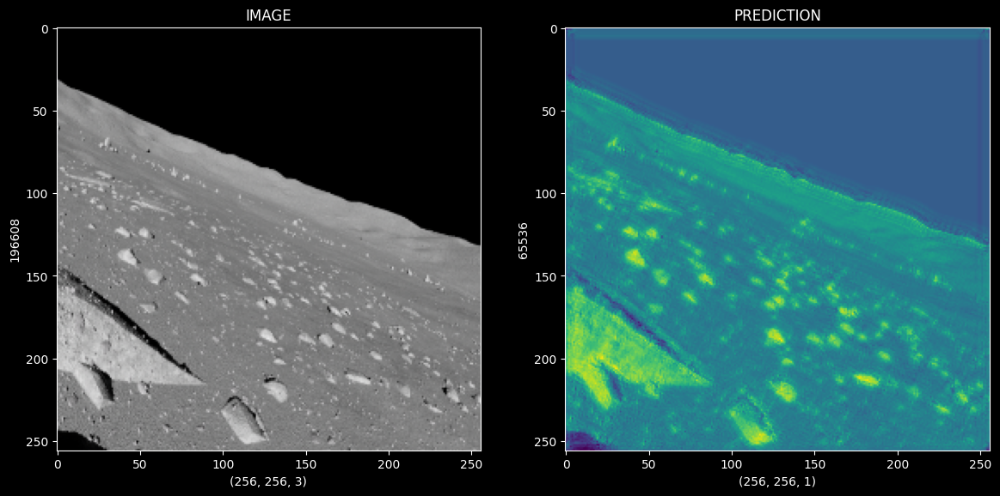

In [91]:
figure,axis = plt.subplots(1,2,figsize=(14,14))
pre_img_number = 6

Original_Img = Train_Set[pre_img_number]
Predict_Mask = Prediction_MASK_Seen[pre_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("PREDICTION")

#### MAIN PREDICTION OVERVIEW

In [92]:
Reading_IMG = cv2.cvtColor(cv2.imread("./Moon_Dataset/real_moon_images/PCAM1.png"),cv2.COLOR_BGR2RGB)
Reading_IMG = cv2.resize(Reading_IMG,(256,256))

In [93]:
print(Reading_IMG.shape)

(256, 256, 3)


In [94]:
Reading_IMG_Shape = Reading_IMG.reshape(1,Reading_IMG.shape[0],Reading_IMG.shape[1],Reading_IMG.shape[2])

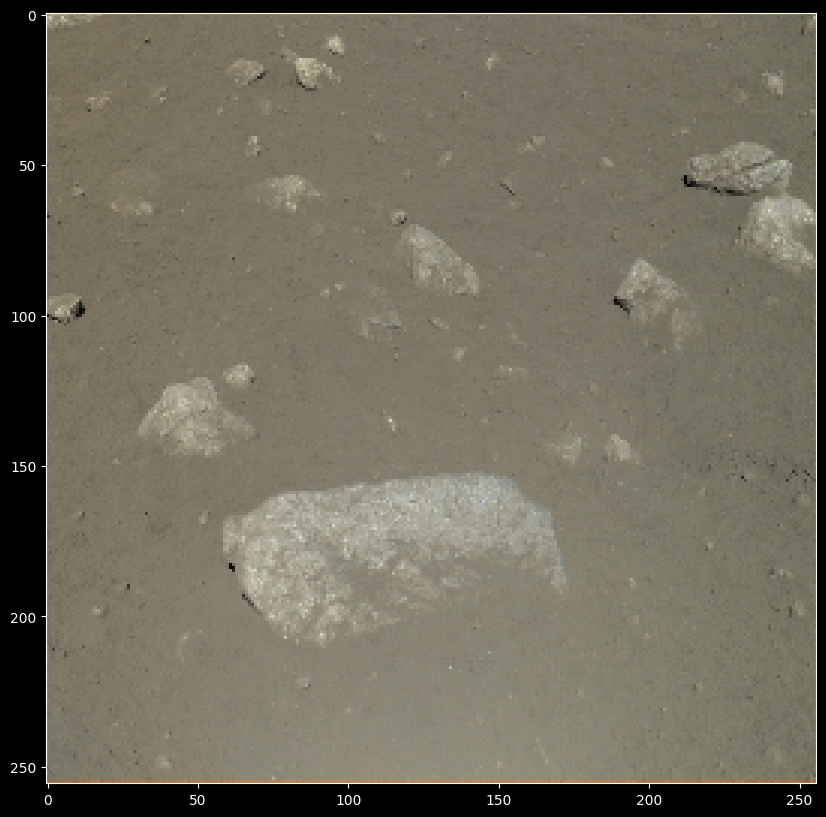

In [95]:
figure = plt.figure(figsize=(10,10))

plt.imshow(Reading_IMG)

In [96]:
MASK_Seen = autoencoder.predict(Reading_IMG_Shape)

1/1 [==============================] - 0s 384ms/step


(-0.5, 255.5, 255.5, -0.5)

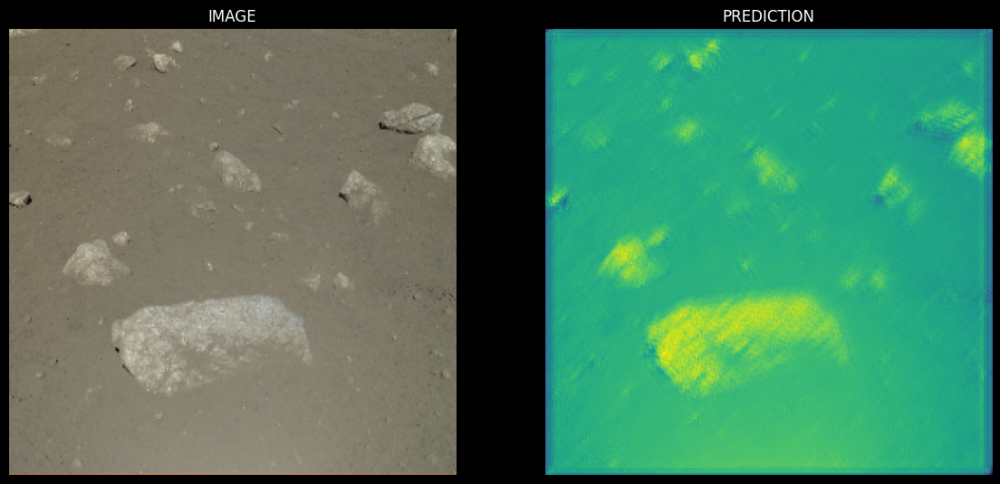

In [97]:
figure,axis = plt.subplots(1,2,figsize=(14,14))

axis[0].imshow(Reading_IMG)
axis[0].set_xlabel(Reading_IMG.shape)
axis[0].set_ylabel(Reading_IMG.size)
axis[0].set_title("IMAGE")
axis[0].axis("off")
axis[1].imshow(MASK_Seen[0])
axis[1].set_xlabel(MASK_Seen[0].shape)
axis[1].set_ylabel(MASK_Seen[0].size)
axis[1].set_title("PREDICTION")
axis[1].axis("off")

#### MAIN PREDICTION

In [98]:
Real_Lunar_Photos = Path("./Moon_Dataset/real_moon_images/")
List_Real_Photos = list(Real_Lunar_Photos.glob(r"*.png"))

In [99]:
print(List_Real_Photos[1])

Moon_Dataset\real_moon_images\g_PCAM10.png


In [100]:
List_Real_Photos = pd.Series(List_Real_Photos,name="TARGET").astype(str)

1/1 [==============================] - 0s 275ms/step


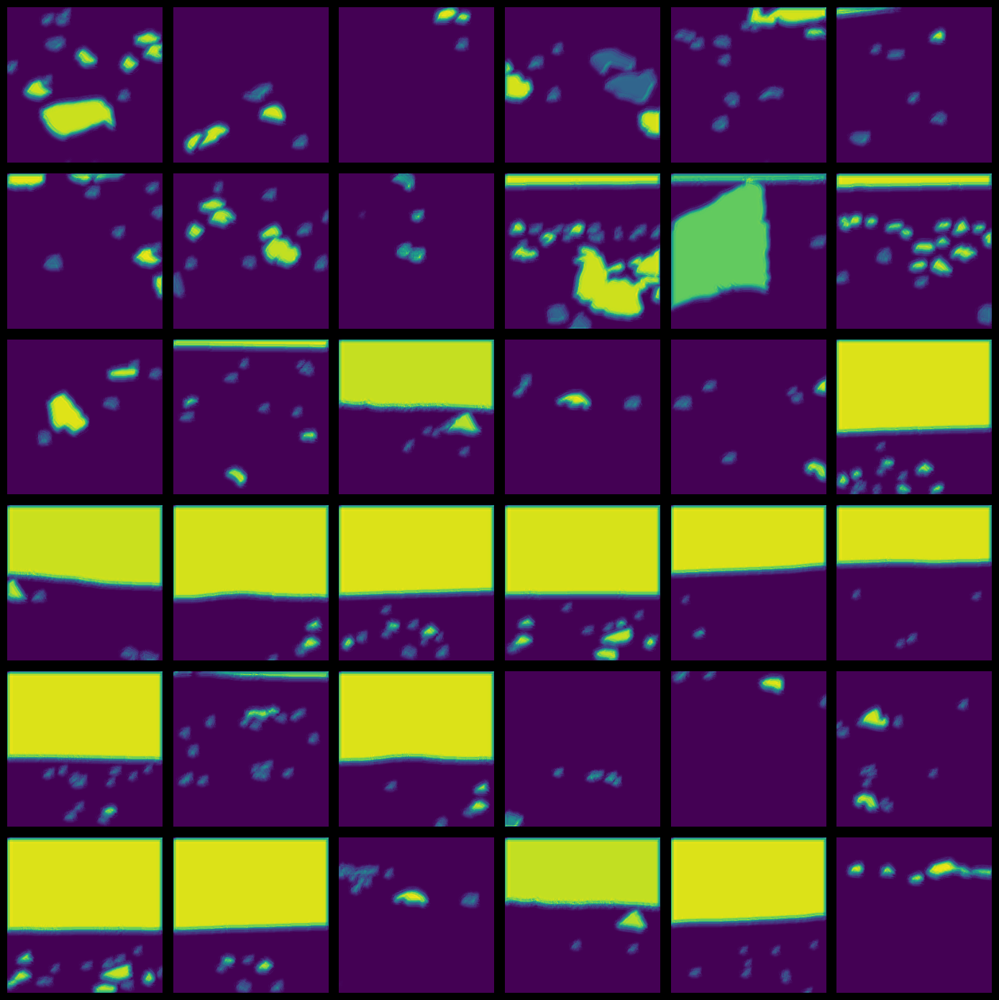

In [101]:
figure,axis = plt.subplots(6,6,figsize=(14,14))

for indexing,operations in enumerate(axis.flat):
    
    Picking_Real_IMG = List_Real_Photos[indexing]
    Reading_IMG = cv2.cvtColor(cv2.imread(Picking_Real_IMG),cv2.COLOR_BGR2RGB)
    Reading_IMG = cv2.resize(Reading_IMG,(256,256))
    Reading_IMG_Shape = Reading_IMG.reshape(1,Reading_IMG.shape[0],Reading_IMG.shape[1],Reading_IMG.shape[2])
    MASK_Prediction = autoencoder.predict(Reading_IMG_Shape)
    
    operations.axis("off")
    operations.imshow(MASK_Prediction[0])

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 292ms/step


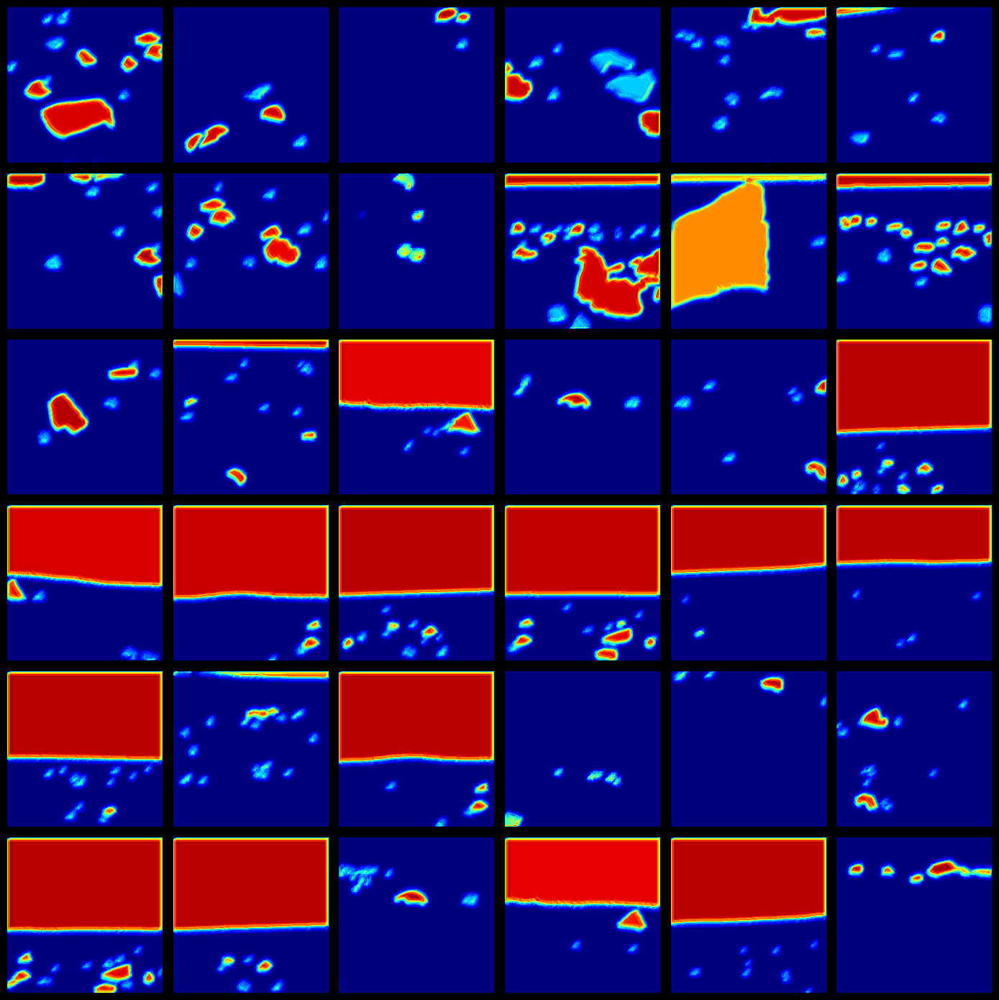

In [102]:
figure,axis = plt.subplots(6,6,figsize=(14,14))

for indexing,operations in enumerate(axis.flat):
    
    Picking_Real_IMG = List_Real_Photos[indexing]
    Reading_IMG = cv2.cvtColor(cv2.imread(Picking_Real_IMG),cv2.COLOR_BGR2RGB)
    Reading_IMG = cv2.resize(Reading_IMG,(256,256))
    Reading_IMG_Shape = Reading_IMG.reshape(1,Reading_IMG.shape[0],Reading_IMG.shape[1],Reading_IMG.shape[2])
    MASK_Prediction = autoencoder.predict(Reading_IMG_Shape)
    
    operations.axis("off")
    operations.imshow(MASK_Prediction[0],cmap="jet")

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 297ms/step


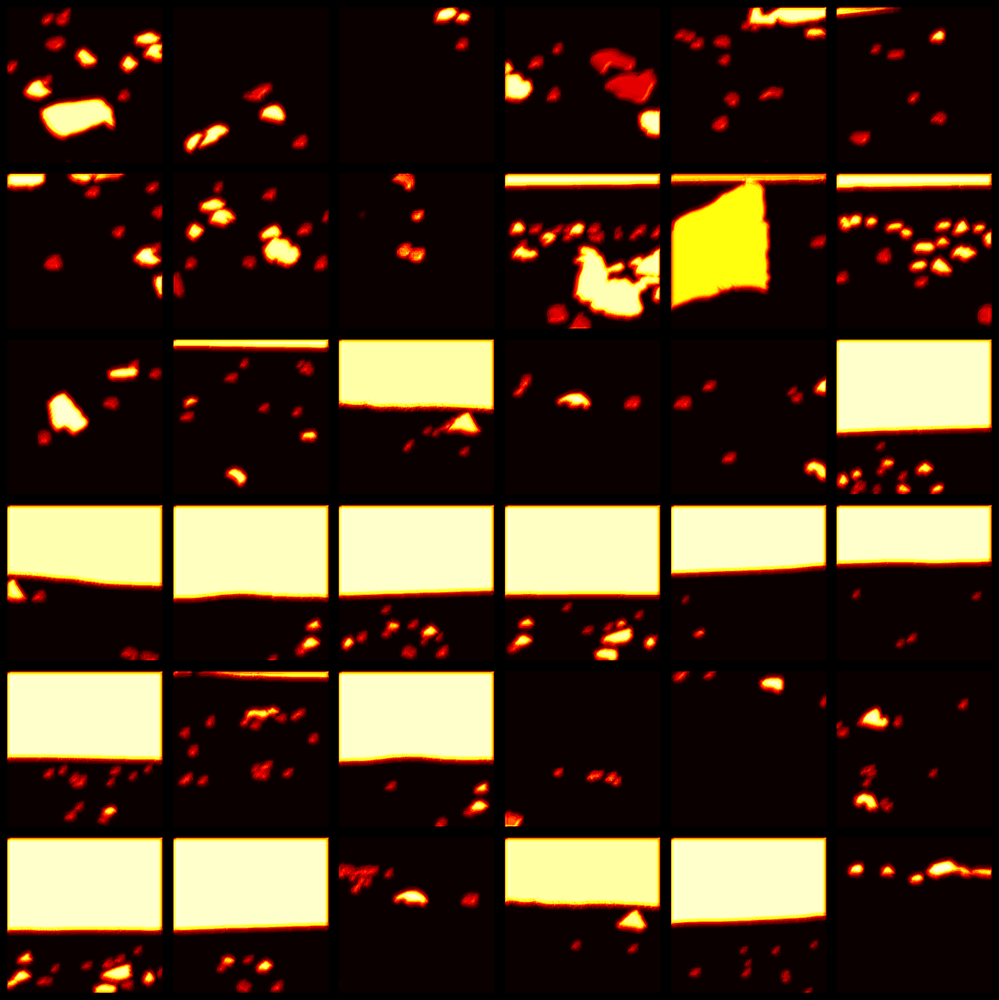

In [103]:
figure,axis = plt.subplots(6,6,figsize=(14,14))

for indexing,operations in enumerate(axis.flat):
    
    Picking_Real_IMG = List_Real_Photos[indexing]
    Reading_IMG = cv2.cvtColor(cv2.imread(Picking_Real_IMG),cv2.COLOR_BGR2RGB)
    Reading_IMG = cv2.resize(Reading_IMG,(256,256))
    Reading_IMG_Shape = Reading_IMG.reshape(1,Reading_IMG.shape[0],Reading_IMG.shape[1],Reading_IMG.shape[2])
    MASK_Prediction = autoencoder.predict(Reading_IMG_Shape)
    
    operations.axis("off")
    operations.imshow(MASK_Prediction[0],cmap="hot")

plt.tight_layout()
plt.show()